# Satellite Image Data Cleaning

## Imports and Setup

In [2]:
import pandas as pd
import geopandas as gpd

import os 
os.chdir('../')
from utils import visual_utils
from utils import config_utils

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

%load_ext autoreload
%autoreload 2

## Data Configuration

In [13]:
iso_code = "TJK"
config_file = os.path.join(os.getcwd(), 'configs/sat_configs/sat_config_500x500_60cm.yaml')
config = config_utils.load_config(config_file)
config["project"] = "GIGAv3"

## Run Pre-trained Model

In [14]:
model_iso_code = "TJK"
data = visual_utils.generate_predictions(iso_code, config, model_iso_code)
print(data.shape)
data.head(3)

(3522, 12)


,UID,source,iso,country,region,subregion,name,giga_id_school,clean,prob,validated,geometry
0,UNICEF-TJK-SCHOOL-00000000,UNICEF,TJK,Tajikistan,Asia,Central Asia,МТМУ,0,0,0.087590,-1,POINT (68.79840 37.76225)
1,UNICEF-TJK-SCHOOL-00000001,UNICEF,TJK,Tajikistan,Asia,Central Asia,МТМУ,1,0,0.154610,-1,POINT (71.60559 36.73077)
2,UNICEF-TJK-SCHOOL-00000002,UNICEF,TJK,Tajikistan,Asia,Central Asia,МТМУ,2,0,0.949918,0,POINT (71.61449 36.72470)


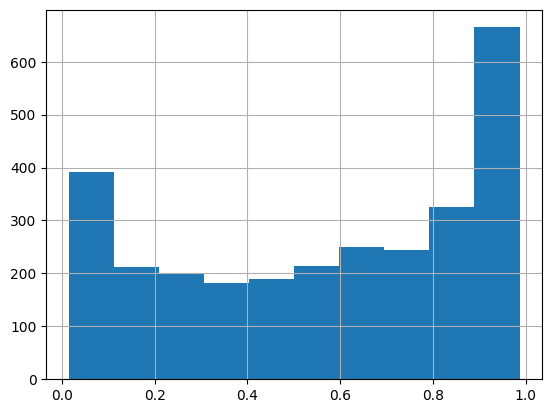

In [9]:
data[data["validated"] == 0]['prob'].hist();

## Visualize Images

INFO:root:Data dimensions: (360, 12)


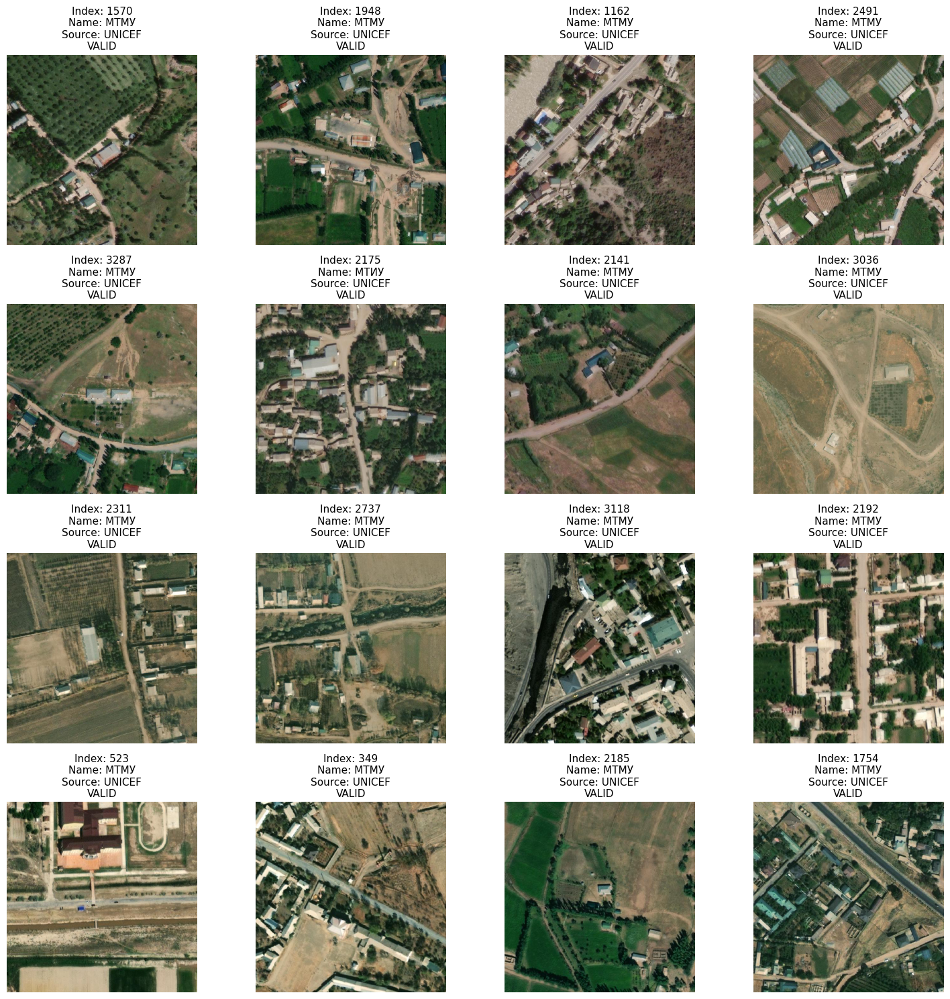

In [15]:
visual_utils.inspect_images(
    config, 
    iso_code=iso_code, 
    category="school", 
    start_index=16*0, 
    random=True, 
    min_prob=0.,
    max_prob=0.1
)

INFO:root:Data dimensions: (5750, 11)


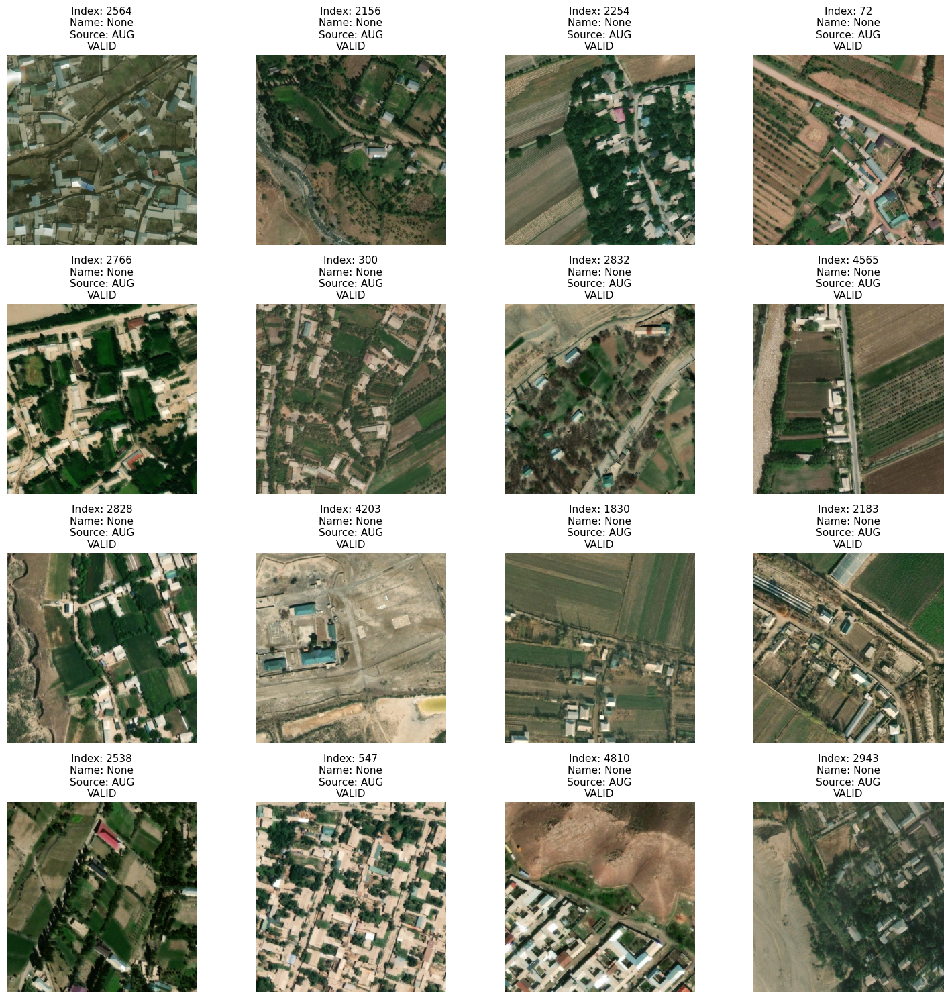

In [12]:
visual_utils.inspect_images(config, iso_code, category="non_school", start_index=16*10, random=True)

## Inspect Points

In [307]:
index = 3322
visual_utils.map_coordinates(config, index, category="school", iso_code=iso_code)

INFO:root:UNICEF-TJK-SCHOOL-00003842
INFO:root:МТМУ
INFO:root:МTMU


## Data Validation

In [308]:
visual_utils.update_validation(
    config, iso_code=iso_code, category="school", 
    indexes=[714]
)

INFO:root:Item 3322 changed to INVALID.


INFO:root:Data dimensions: (222, 12)


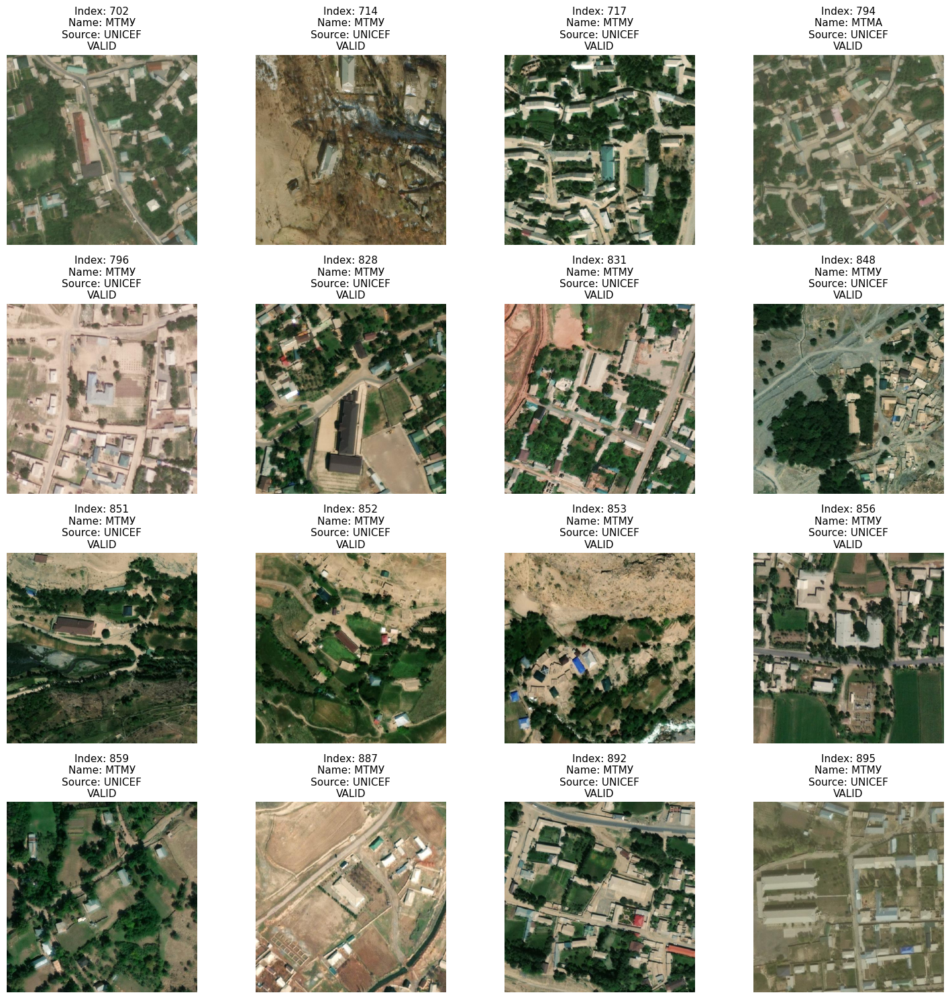

In [16]:
visual_utils.inspect_images(
    config, 
    iso_code=iso_code, 
    category="school", 
    start_index=16*3,
    random=False, 
    show_validated=True,
    min_prob=0.5,
    max_prob=0.6
)

## Using IPywidgets

In [170]:
visual_utils.validate_data(
    config, 
    iso_code, 
    category="school", 
    start_index=16*0, 
    show_validated=True,
    min_prob=0,
    max_prob=0.1
)